# Capstone Project - The Battle of the Neighborhoods
### Applied Data Science Capstone by IBM/Coursera

## Table of contents
* [Introduction: Business Problem](#introduction)
* [Data](#data)
* [Methodology](#methodology)
* [Analysis](#analysis)
* [Results and Discussion](#results)
* [Conclusion](#conclusion)

## Introduction: Business Problem
A client is looking to open a sushi restaurant in Toronto. Sushi menus tend to be expensive, however, sushi lovers are willing to pay a premium price for an expertly crafted roll. Sushi thrives in urban centers with an active nightlife and in an area with a concentration of working professionals. A sushi restaurant that is located within a walking distance of office workers can bring a booming business during the day. If the restaurant is also located near a thriving bar, it can bring customers in for dinner.


## Data
In order to determine if opening a sushi restaurant in the Toronto area will be a profitable pursuit, we will utilize data from Foursquare. First, we will use the following Wikipedia page, https://en.wikipedia.org/wiki/List_of_postal_codes_of_Canada:_M to get the postal codes of Toronto. We will use a csv file Geospatial_data.csv to get the geographical coordinates of each postal zip code in order to utilize the Foursquare location data. We will then use Foursquare API to retrieve information about the popular venues in Toronto. We will obtain the locations that have thriving bars as well as the locations that have a walking distance to offices. Data of average home prices in the area will also be used to determine the best location for the new restaurant.

Let's downoload all the dependencies that we will need.

In [1]:
import numpy as np
import pandas as pd
import json
!pip install geopy
from bs4 import BeautifulSoup
from geopy.geocoders import Nominatim
import requests
from pandas.io.json import json_normalize
import matplotlib.cm as cm
import matplotlib.colors as colors
from sklearn.cluster import KMeans
!pip install folium
import folium
import io

Now let's load the data into Pandas

In [2]:
source = requests.get('https://en.wikipedia.org/wiki/List_of_postal_codes_of_Canada:_M').text

soup = BeautifulSoup(source, 'html5lib')

postal_codes_dict = {} # initialize an empty dictionary to save the data in
for table_cell in soup.find_all('td'):
    try:
        postal_code = table_cell.p.b.text # get the postal code
        postal_code_investigate = table_cell.span.text
        neighborhoods_data = table_cell.span.text # get the rest of the data in the cell
        borough = neighborhoods_data.split('(')[0] # get the borough in the cell
        
        # if the cell is not assigned then ignore it
        if neighborhoods_data == 'Not assigned':
            neighborhoods = []
        # else process the data and add it to the dictionary
        else:
            postal_codes_dict[postal_code] = {}
            
            try:
                neighborhoods = neighborhoods_data.split('(')[1]
            
                # remove parantheses from neighborhoods string
                neighborhoods = neighborhoods.replace('(', ' ')
                neighborhoods = neighborhoods.replace(')', ' ')

                neighborhoods_names = neighborhoods.split('/')
                neighborhoods_clean = ', '.join([name.strip() for name in neighborhoods_names])
            except:
                borough = borough.strip('\n')
                neighborhoods_clean = borough
 
            # add borough and neighborhood to dictionary
            postal_codes_dict[postal_code]['borough'] = borough
            postal_codes_dict[postal_code]['neighborhoods'] = neighborhoods_clean
    except:
        pass
    
# create an empty dataframe
columns = ['Postal Code', 'Borough', 'Neighborhood']
toronto_data = pd.DataFrame(columns=columns)
toronto_data

# populate dataframe with data from dictionary
for ind, postal_code in enumerate(postal_codes_dict):
    borough = postal_codes_dict[postal_code]['borough']
    neighborhood = postal_codes_dict[postal_code]['neighborhoods']
    toronto_data = toronto_data.append({"Postal Code": postal_code, 
                                        "Borough": borough, 
                                        "Neighborhood": neighborhood},
                                        ignore_index=True)

# print number of rows of dataframe
toronto_data.shape[0]

103

Load Geospatial_Coordinates.csv file into pandas.

In [3]:
geo_coor = pd.read_csv("C:\\Users\\Anita\\Desktop\\geospatial_coordinates.csv")

Merge the two dataframes into one dataframe to get the coordinates of each postal code.

In [4]:
df_toronto = pd.merge(toronto_data, geo_coor, how='left', left_on = 'Postal Code', right_on = 'Postal Code')
# remove the "Postal Code" column
df_toronto.drop("Postal Code", axis=1, inplace=True)
df_toronto.head()

,Borough,Neighborhood,Latitude,Longitude
0,North York,Parkwoods,43.753259,-79.329656
1,North York,Victoria Village,43.725882,-79.315572
2,Downtown Toronto,"Regent Park, Harbourfront",43.654260,-79.360636
3,North York,"Lawrence Manor, Lawrence Heights",43.718518,-79.464763
4,Queen's Park,Ontario Provincial Government,43.662301,-79.389494


Create a map of Toronto using the neighborhoods data.

In [5]:
address = 'Toronto'

geolocator = Nominatim(user_agent="to_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude

In [6]:
map_toronto = folium.Map(Location = [latitude, longitude], zoom_start = 10)

#Add markers to the map

for lat, lng, borough, neighborhood in zip(df_toronto['Latitude'], df_toronto['Longitude'], df_toronto['Borough'], df_toronto['Neighborhood']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.5,
        parse_html=False).add_to(map_toronto)  
    
map_toronto

## Average Real Estate Price of Postal Codes in Toronto: Web Scraping

Now we will check the average land price of each postal code in Toronto. Since sushi tends to be expensive, the optimal location for a sushi restaurant will be in an area with higher than average home prices.

Lets scrape average real estate price data of Toronto from the url https://housepricehub.com/cities/city/Toronto

In [89]:
headers = {
    "User-Agent": "Mozilla/5.0 (X11; Ubuntu; Linux x86_64; rv:86.0) Gecko/20100101 Firefox/86.0",
    "Accept-Language": "en-US,en;q=0.5",
}

r = requests.get(
    "https://housepricehub.com/cities/city/Toronto", headers=headers
)

df_real = pd.read_html(r.text)[-1]

df_real.iloc[:, 0] = df_real.iloc[:, 0].str.replace(r"(\d+)(.*)", r"\1 \2")
print(df_real)

    Postal Code     City Average Price Average Price Per Frontage Ft  \
0          M2 L  Toronto    $7,152,916                           NaN   
1          M4 W  Toronto    $5,847,812                           NaN   
2          M3 C  Toronto    $5,792,453                           NaN   
3          M3 B  Toronto    $5,289,950                           NaN   
4          M5 P  Toronto    $5,184,328                           NaN   
..          ...      ...           ...                           ...   
97         M3 N  Toronto      $905,021                           NaN   
98         M2 A  Toronto      $839,000                           NaN   
99         M5 E  Toronto      $799,000                           NaN   
100        M7 K  Toronto      $699,900                       $17,497   
101        M1 Y  Toronto      $699,900                           NaN   

     Total listings  Average Price Trend  
0                42                  NaN  
1                16                  NaN  
2     

Select Postal Code and Average Price columns from the dataframe.

In [90]:
df_real=df_real[['Postal Code', 'Average Price']]
df_real.head()

,Postal Code,Average Price
0,M2 L,"$7,152,916"
1,M4 W,"$5,847,812"
2,M3 C,"$5,792,453"
3,M3 B,"$5,289,950"
4,M5 P,"$5,184,328"


Merge the dataframe with geo_coor dataframe to get the cooridnates.

In [91]:
df_real['Postal Code'] = df_real['Postal Code'].str.replace('\s+','')
toronto_real= pd.merge(geo_coor,df_real,how='left',on='Postal Code')
toronto_real.head()

,Postal Code,Latitude,Longitude,Average Price
0,M1B,43.806686,-79.194353,"$912,160"
1,M1C,43.784535,-79.160497,"$1,500,296"
2,M1E,43.763573,-79.188711,"$1,158,451"
3,M1G,43.770992,-79.216917,"$929,451"
4,M1H,43.773136,-79.239476,"$999,749"


Check the size of the dataframe.

In [92]:
toronto_real.shape

(103, 4)

Drop nan values.

In [93]:
toronto_real= toronto_real.replace('-',np.nan).dropna()

In [94]:
toronto_real.shape

(94, 4)

Remove $ signs and commas from Average Price column.

In [95]:
cols_to_clean = ['Average Price']
for col in cols_to_clean:
    toronto_real[col] = toronto_real[col].map(lambda x: x.replace('$',''))
    
    
for col in cols_to_clean:
    toronto_real[col] = [x.replace(',', '') if ',' in x else x for x in toronto_real[col]]
    
toronto_real.head()

,Postal Code,Latitude,Longitude,Average Price
0,M1B,43.806686,-79.194353,912160
1,M1C,43.784535,-79.160497,1500296
2,M1E,43.763573,-79.188711,1158451
3,M1G,43.770992,-79.216917,929451
4,M1H,43.773136,-79.239476,999749


Check data types.

In [97]:
toronto_real.dtypes

Postal Code       object
Latitude         float64
Longitude        float64
Average Price     object
dtype: object

Since we want to create a map using this dataframe, we will need to convert Average Price column from Object to integer.

In [98]:
toronto_real['Average Price'] = pd.to_numeric(toronto_real['Average Price'])

In [99]:
toronto_real.dtypes

Postal Code       object
Latitude         float64
Longitude        float64
Average Price      int64
dtype: object

Now let's create a choropleth map of Toronto to view the Average Price of homes in each postal code.

In [87]:
ontario_geo = "C:\\Users\\Anita\\Desktop\\torontomap.geojson"

toronto_location = [43.653963, -79.387207]

toronto_real_map = folium.Map(location=toronto_location, zoom_start=10)


folium.Choropleth(geo_data=ontario_geo,
      data = toronto_real,
      columns=['Postal Code','Average Price'],
      key_on='feature.properties.CFSAUID',
      fill_color='YlOrRd',
      fill_opacity=0.7, 
      line_opacity=0.2,
      legend_name='Toronto Real Estate Values',).add_to(toronto_real_map)

toronto_real_map

## Foursquare

We will use Foursquare API to explore the venues in Toronto.

First, let's define our Foursquare credentials.

In [14]:
CLIENT_ID = '0RVHIXI1PWDX2YNRM22XMKOJ0BDR550JP42B0LIJMC445024'
CLIENT_SECRET = 'CFOW003A5P0QST34J4BSIFQPUJBW2XDPFRPMX5KJ1YLIGR2Y'
VERSION = '20210410'
RADIUS=1000
LIMIT = 100
print('Client ID:', CLIENT_ID)
print ('Clent Secret:', CLIENT_SECRET)

Client ID: 0RVHIXI1PWDX2YNRM22XMKOJ0BDR550JP42B0LIJMC445024
Clent Secret: CFOW003A5P0QST34J4BSIFQPUJBW2XDPFRPMX5KJ1YLIGR2Y


In [15]:
LIMIT = 100 # limit of number of venues returned by Foursquare API
radius = 1000 # define radius
url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    latitude, 
    longitude, 
    RADIUS, 
    LIMIT)

# get the result to a json file
results = requests.get(url).json()

Obtain the get_category_type function to extract category of venue.

In [16]:
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

Extract the data of venues in Toronto to create a new dataframe.

In [17]:
def getNearbyVenues(names, latitudes, longitudes, radius=1000, LIMIT=100):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            RADIUS, 
            LIMIT)
            
        # make the GET request
        
        results = requests.get(url).json()['response'].get('groups',[{}])[0].get('items', [])
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

Create a new dataframe called toronto_venues.

In [18]:
toronto_venues = getNearbyVenues(names=df_toronto['Neighborhood'],latitudes=df_toronto['Latitude'],longitudes=df_toronto['Longitude'])

Parkwoods
Victoria Village
Regent Park, Harbourfront
Lawrence Manor, Lawrence Heights
Ontario Provincial Government
Islington Avenue
Malvern, Rouge
Don Mills North
Parkview Hill, Woodbine Gardens
Garden District, Ryerson
Glencairn
West Deane Park, Princess Gardens, Martin Grove, Islington, Cloverdale
Rouge Hill, Port Union, Highland Creek
Don Mills South
Woodbine Heights
St. James Town
Humewood-Cedarvale
Eringate, Bloordale Gardens, Old Burnhamthorpe, Markland Wood
Guildwood, Morningside, West Hill
The Beaches
Berczy Park
Caledonia-Fairbanks
Woburn
Leaside
Central Bay Street
Christie
Cedarbrae
Hillcrest Village
Bathurst Manor, Wilson Heights, Downsview North
Thorncliffe Park
Richmond, Adelaide, King
Dufferin, Dovercourt Village
Scarborough Village
Fairview, Henry Farm, Oriole
Northwood Park, York University
The Danforth  East
Harbourfront East, Union Station, Toronto Islands
Little Portugal, Trinity
Kennedy Park, Ionview, East Birchmount Park
Bayview Village
Downsview East
The Danforth

Looks good, now lets check the size of the dataframe.

In [19]:
print(toronto_venues.shape)
toronto_venues.head()

(4880, 7)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Parkwoods,43.753259,-79.329656,Allwyn's Bakery,43.759840,-79.324719,Caribbean Restaurant
1,Parkwoods,43.753259,-79.329656,Brookbanks Park,43.751976,-79.332140,Park
2,Parkwoods,43.753259,-79.329656,Tim Hortons,43.760668,-79.326368,Café
3,Parkwoods,43.753259,-79.329656,Bruno's valu-mart,43.746143,-79.324630,Grocery Store
4,Parkwoods,43.753259,-79.329656,A&W,43.760643,-79.326865,Fast Food Restaurant


Let's find out how many unique catergories can be extracted from the venues.

In [20]:
print('There are {} uniques categories.'.format(toronto_venues['Venue Category'].nunique()))

There are 330 uniques categories.


## Methodology

In this project we will try to find locations in Toronto that have lots of venues including coffee shops and bars but don't have sushi restaurants.

In the first step, we have collected the required data: The neighborhoods and their locations and also the venues in each of these neighborhoods to see density. We have collected the average real estate prices of the neighborhoods in Toronto. We have identified sushi restaurants, coffee shops and other venues using Foursquare.

Second step in our analysis involves exploration of venues across different areas of Toronto. We will use maps to identity a few promising areas close to center with low number of sushi restaurants and high number of other venues such as tapas restaurants, coffee shops, and bars.

In the third and final step, we will focus on the most promising areas and within those create clusters of locations (using k-means clustering) that meet some basic requirements established in discussion with our client.


## Analysis

We will search for 'Sushi Restaurant'. We are interested in avoiding neighborhoods that already have a sushi reastaurant. 

In [47]:
df_sushi = toronto_venues[toronto_venues['Venue Category'] == 'Sushi Restaurant'].reset_index(drop=True)
print(df_sushi.shape)
df_sushi.head()

(75, 7)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,"Regent Park, Harbourfront",43.654260,-79.360636,Miyaki Sushi,43.649497,-79.366178,Sushi Restaurant
1,"Regent Park, Harbourfront",43.654260,-79.360636,Qi sushi,43.662552,-79.364258,Sushi Restaurant
2,"Regent Park, Harbourfront",43.654260,-79.360636,Sushi Bar,43.658798,-79.350085,Sushi Restaurant
3,"Lawrence Manor, Lawrence Heights",43.718518,-79.464763,Yuki Japanese Restaurant,43.720610,-79.456119,Sushi Restaurant
4,"Lawrence Manor, Lawrence Heights",43.718518,-79.464763,Tora Aburi Sushi,43.724257,-79.455383,Sushi Restaurant


Search for 'Tapas Restaurant'. We are intersted in neighborhoods that have a Tapas Restaurant because we want to open the restaurant in an area that has an active night life.

In [46]:
df_tapas = toronto_venues[toronto_venues['Venue Category'] == 'Tapas Restaurant'].reset_index(drop=True)
print(df_tapas.shape)
df_tapas.head()

(4, 7)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,"Little Portugal, Trinity",43.647927,-79.419750,Bar Isabel,43.654782,-79.420717,Tapas Restaurant
1,"The Danforth West, Riverdale",43.679557,-79.352188,Tapas at Embrujo,43.676175,-79.358411,Tapas Restaurant
2,"Kensington Market, Chinatown, Grange Park",43.653206,-79.400049,Bar Raval,43.655904,-79.410125,Tapas Restaurant
3,"The Kingsway, Montgomery Road, Old Mill North",43.653654,-79.506944,Azarias,43.647137,-79.513196,Tapas Restaurant


Search for 'Coffee Shops'. Coffee shops tend to be located near offices and banks so neighborhood with many coffee shops is ideal location for a sushi restaurant as it will attract customers in for lunch.

In [45]:
df_coffee = toronto_venues[toronto_venues['Venue Category'] == 'Coffee Shop'].reset_index(drop=True)
print(df_coffee.shape)
df_coffee.head()

(377, 7)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Parkwoods,43.753259,-79.329656,La Notre,43.760704,-79.325396,Coffee Shop
1,Victoria Village,43.725882,-79.315572,Tim Hortons,43.725517,-79.313103,Coffee Shop
2,Victoria Village,43.725882,-79.315572,Tim Hortons,43.727082,-79.327143,Coffee Shop
3,"Regent Park, Harbourfront",43.654260,-79.360636,Tandem Coffee,43.653559,-79.361809,Coffee Shop
4,"Regent Park, Harbourfront",43.654260,-79.360636,Rooster Coffee,43.651900,-79.365609,Coffee Shop


Search for 'Cocktail Bars'. A neighborhood that has a cocktail bar and doesn't already have a sushi restaurant is an ideal location.

In [44]:
df_cocktail = toronto_venues[toronto_venues['Venue Category'] == 'Cocktail Bar'].reset_index(drop=True)
print(df_cocktail.shape)
df_cocktail.head()

(15, 7)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,St. James Town,43.651494,-79.375418,D.W. Alexander,43.648333,-79.373826,Cocktail Bar
1,Berczy Park,43.644771,-79.373306,D.W. Alexander,43.648333,-79.373826,Cocktail Bar
2,Christie,43.669542,-79.422564,Northwood,43.662715,-79.422164,Cocktail Bar
3,Christie,43.669542,-79.422564,Civil Liberties,43.662096,-79.425183,Cocktail Bar
4,Christie,43.669542,-79.422564,Mulberry Bar,43.662549,-79.423344,Cocktail Bar


Search for 'Bars'. A neighborhood with many bars is great for bringing customers in the evening.

In [43]:
df_bar = toronto_venues[toronto_venues['Venue Category'] == 'Bar'].reset_index(drop=True)
print(df_bar.shape)
df_bar.head()

(59, 7)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,"Regent Park, Harbourfront",43.654260,-79.360636,Betty's,43.651587,-79.367515,Bar
1,Don Mills North,43.745906,-79.352188,Fox & Fiddle,43.754614,-79.350159,Bar
2,The Beaches,43.676357,-79.293031,Castro's Lounge,43.671104,-79.295107,Bar
3,The Beaches,43.676357,-79.293031,Gabby's Food & Fuel,43.670809,-79.296657,Bar
4,Christie,43.669542,-79.422564,The Gem,43.674585,-79.431947,Bar


Let's visualize these venues.

In [36]:
venues_map = folium.Map(location=[latitude, longitude], zoom_start=12) 

for lat, lng, label in zip(df_sushi['Venue Latitude'], df_sushi['Venue Longitude'], df_sushi['Venue']):
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        color='blue',
        popup=label,
        fill = True,
        fill_color='red',
        fill_opacity=0.4,
        parse_html=False).add_to(venues_map)
    
for lat, lng, label in zip(df_tapas['Venue Latitude'], df_tapas['Venue Longitude'], df_tapas['Venue']):
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        color='red',
        popup=label,
        fill = True,
        fill_color='red',
        fill_opacity=0.4,
        parse_html=False).add_to(venues_map)
        
for lat, lng, label in zip(df_coffee['Venue Latitude'], df_coffee['Venue Longitude'], df_coffee['Venue']):
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        color='green',
        popup=label,
        fill = True,
        fill_color='red',
        fill_opacity=0.4,
        parse_html=False).add_to(venues_map)
    
for lat, lng, label in zip(df_cocktail['Venue Latitude'], df_cocktail['Venue Longitude'], df_cocktail['Venue']):
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        color='yellow',
        popup=label,
        fill = True,
        fill_color='red',
        fill_opacity=0.4,
        parse_html=False).add_to(venues_map)
    
    
for lat, lng, label in zip(df_bar['Venue Latitude'], df_bar['Venue Longitude'], df_bar['Venue']):
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        color='purple',
        popup=label,
        fill = True,
        fill_color='red',
        fill_opacity=0.4,
        parse_html=False).add_to(venues_map)
    
         
    
        
# display map
venues_map

Let's analyze each neighborhood.

In [48]:
# one hot encoding
toronto_onehot = pd.get_dummies(toronto_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
toronto_onehot['Neighborhood'] = toronto_venues['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [toronto_onehot.columns[-1]] + list(toronto_onehot.columns[:-1])
toronto_onehot = toronto_onehot[fixed_columns]

toronto_onehot.head()


,Zoo,ATM,Accessories Store,Afghan Restaurant,Airport,Airport Lounge,American Restaurant,Amphitheater,Animal Shelter,Antique Shop,...,Vegetarian / Vegan Restaurant,Video Game Store,Video Store,Vietnamese Restaurant,Warehouse Store,Whisky Bar,Wine Bar,Wings Joint,Women's Store,Yoga Studio
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


Let's group rows by neighborhood and by taking the mean of the frequency of occurrence of each category.

In [49]:
toronto_grouped = toronto_onehot.groupby('Neighborhood').mean().reset_index()
toronto_grouped.head()

,Neighborhood,Zoo,ATM,Accessories Store,Afghan Restaurant,Airport,Airport Lounge,American Restaurant,Amphitheater,Animal Shelter,...,Vegetarian / Vegan Restaurant,Video Game Store,Video Store,Vietnamese Restaurant,Warehouse Store,Whisky Bar,Wine Bar,Wings Joint,Women's Store,Yoga Studio
0,Agincourt,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.02381,0.0,0.0,0.0,0.000000,0.0,0.0
1,"Alderwood, Long Branch",0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.000000,0.0,0.0
2,"Bathurst Manor, Wilson Heights, Downsview North",0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.000000,0.0,0.0
3,Bayview Village,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.000000,0.0,0.0
4,"Bedford Park, Lawrence Manor East",0.0,0.0,0.0,0.0,0.0,0.0,0.025641,0.0,0.0,...,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.025641,0.0,0.0


Let's print each neighborhood along with the top 5 most common venues.

In [50]:
num_top_venues = 5

for hood in toronto_grouped['Neighborhood']:
    print("----"+hood+"----")
    temp = toronto_grouped[toronto_grouped['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue_category ','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----Agincourt----
        venue_category   freq
0    Chinese Restaurant  0.14
1         Shopping Mall  0.07
2                Bakery  0.05
3           Pizza Place  0.05
4  Caribbean Restaurant  0.05


----Alderwood, Long Branch----
     venue_category   freq
0     Discount Store  0.12
1  Convenience Store  0.08
2        Pizza Place  0.08
3               Park  0.08
4           Pharmacy  0.08


----Bathurst Manor, Wilson Heights, Downsview North----
  venue_category   freq
0     Pizza Place  0.06
1     Coffee Shop  0.06
2            Bank  0.06
3  Ice Cream Shop  0.03
4        Ski Area  0.03


----Bayview Village----
       venue_category   freq
0                 Bank  0.12
1          Gas Station  0.12
2        Grocery Store  0.12
3  Japanese Restaurant  0.12
4                Trail  0.06


----Bedford Park, Lawrence Manor East----
        venue_category   freq
0    Italian Restaurant  0.08
1           Coffee Shop  0.08
2                  Bank  0.05
3  Fast Food Restaurant  0.05
4          

Let's put that into pandas dataframe. First let's write a function to sort the venues in descending order.

In [53]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

Now, create the new dataframe and display the top 10 venues for each neighborhood.

In [52]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = toronto_grouped['Neighborhood']

for ind in np.arange(toronto_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(toronto_grouped.iloc[ind, :], num_top_venues)


neighborhoods_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Agincourt,Chinese Restaurant,Shopping Mall,Bakery,Pizza Place,Caribbean Restaurant,Supermarket,Discount Store,Japanese Restaurant,Bank,Restaurant
1,"Alderwood, Long Branch",Discount Store,Convenience Store,Pizza Place,Pharmacy,Park,Trail,Skating Rink,Sandwich Place,Bagel Shop,Garden Center
2,"Bathurst Manor, Wilson Heights, Downsview North",Pizza Place,Bank,Coffee Shop,Community Center,Supermarket,Intersection,Restaurant,Fried Chicken Joint,Dog Run,Sushi Restaurant
3,Bayview Village,Bank,Grocery Store,Gas Station,Japanese Restaurant,Chinese Restaurant,Café,Intersection,Park,Trail,Restaurant
4,"Bedford Park, Lawrence Manor East",Italian Restaurant,Coffee Shop,Pet Store,Fast Food Restaurant,Bank,Sandwich Place,Bagel Shop,Bakery,Sushi Restaurant,Juice Bar


## Clustering Neighborhoods

Run k-means to cluster the neighborhood into 5 clusters.

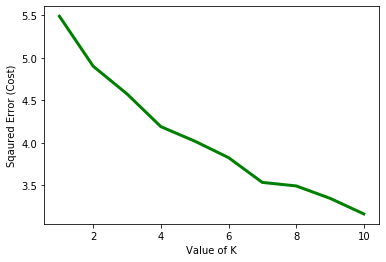

In [54]:
import matplotlib.pyplot as plt  

cost =[] 
toronto_grouped_clustering = toronto_grouped.drop('Neighborhood', 1)

for i in range(1, 11): 
    KM = KMeans(n_clusters = i, max_iter = 500) 
    KM.fit(toronto_grouped_clustering) 
      
    # calculates squared error 
    # for the clustered points 
    cost.append(KM.inertia_)      

# plot the cost against K values   
plt.plot(range(1, 11), cost, color ='g', linewidth ='3') 
plt.xlabel("Value of K") 
plt.ylabel("Sqaured Error (Cost)") 
plt.show() # clear the plot 

In [55]:
# best number of k is 5
kclusters = 5

toronto_grouped_clustering = toronto_grouped.drop('Neighborhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(toronto_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10]

array([1, 0, 1, 1, 2, 2, 0, 2, 2, 0])

Let's create a new dataframe that includes the cluster as well as the top 10 venues for each neighborhood.

In [56]:
# add clustering labels
neighborhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

toronto_merged = toronto_venues

toronto_merged = toronto_merged.join(neighborhoods_venues_sorted.set_index('Neighborhood'), on='Neighborhood')

toronto_merged.head(10)

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Parkwoods,43.753259,-79.329656,Allwyn's Bakery,43.759840,-79.324719,Caribbean Restaurant,0,Park,Pharmacy,Shopping Mall,Bus Stop,Cosmetics Shop,Café,Laundry Service,Supermarket,Caribbean Restaurant,Tennis Court
1,Parkwoods,43.753259,-79.329656,Brookbanks Park,43.751976,-79.332140,Park,0,Park,Pharmacy,Shopping Mall,Bus Stop,Cosmetics Shop,Café,Laundry Service,Supermarket,Caribbean Restaurant,Tennis Court
2,Parkwoods,43.753259,-79.329656,Tim Hortons,43.760668,-79.326368,Café,0,Park,Pharmacy,Shopping Mall,Bus Stop,Cosmetics Shop,Café,Laundry Service,Supermarket,Caribbean Restaurant,Tennis Court
3,Parkwoods,43.753259,-79.329656,Bruno's valu-mart,43.746143,-79.324630,Grocery Store,0,Park,Pharmacy,Shopping Mall,Bus Stop,Cosmetics Shop,Café,Laundry Service,Supermarket,Caribbean Restaurant,Tennis Court
4,Parkwoods,43.753259,-79.329656,A&W,43.760643,-79.326865,Fast Food Restaurant,0,Park,Pharmacy,Shopping Mall,Bus Stop,Cosmetics Shop,Café,Laundry Service,Supermarket,Caribbean Restaurant,Tennis Court
5,Parkwoods,43.753259,-79.329656,Food Basics,43.760549,-79.326045,Supermarket,0,Park,Pharmacy,Shopping Mall,Bus Stop,Cosmetics Shop,Café,Laundry Service,Supermarket,Caribbean Restaurant,Tennis Court
6,Parkwoods,43.753259,-79.329656,High Street Fish & Chips,43.745260,-79.324949,Fish & Chips Shop,0,Park,Pharmacy,Shopping Mall,Bus Stop,Cosmetics Shop,Café,Laundry Service,Supermarket,Caribbean Restaurant,Tennis Court
7,Parkwoods,43.753259,-79.329656,Shoppers Drug Mart,43.760857,-79.324961,Pharmacy,0,Park,Pharmacy,Shopping Mall,Bus Stop,Cosmetics Shop,Café,Laundry Service,Supermarket,Caribbean Restaurant,Tennis Court
8,Parkwoods,43.753259,-79.329656,Shoppers Drug Mart,43.745315,-79.325800,Pharmacy,0,Park,Pharmacy,Shopping Mall,Bus Stop,Cosmetics Shop,Café,Laundry Service,Supermarket,Caribbean Restaurant,Tennis Court
9,Parkwoods,43.753259,-79.329656,Pizza Pizza,43.760231,-79.325666,Pizza Place,0,Park,Pharmacy,Shopping Mall,Bus Stop,Cosmetics Shop,Café,Laundry Service,Supermarket,Caribbean Restaurant,Tennis Court


 Now let's visualize the resulting clusters.

In [57]:
# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(toronto_merged['Neighborhood Latitude'], toronto_merged['Neighborhood Longitude'], toronto_merged['Neighborhood'], toronto_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[int(cluster)-1],
        fill=True,
        fill_color=rainbow[int(cluster)-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

## Examine Clusters

Cluster 1

In [58]:
toronto_merged.loc[toronto_merged['Cluster Labels'] == 0, toronto_merged.columns[[1,2] + list(range(5, toronto_merged.shape[1]))]]

,Neighborhood Latitude,Neighborhood Longitude,Venue Longitude,Venue Category,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,43.753259,-79.329656,-79.324719,Caribbean Restaurant,0,Park,Pharmacy,Shopping Mall,Bus Stop,Cosmetics Shop,Café,Laundry Service,Supermarket,Caribbean Restaurant,Tennis Court
1,43.753259,-79.329656,-79.332140,Park,0,Park,Pharmacy,Shopping Mall,Bus Stop,Cosmetics Shop,Café,Laundry Service,Supermarket,Caribbean Restaurant,Tennis Court
2,43.753259,-79.329656,-79.326368,Café,0,Park,Pharmacy,Shopping Mall,Bus Stop,Cosmetics Shop,Café,Laundry Service,Supermarket,Caribbean Restaurant,Tennis Court
3,43.753259,-79.329656,-79.324630,Grocery Store,0,Park,Pharmacy,Shopping Mall,Bus Stop,Cosmetics Shop,Café,Laundry Service,Supermarket,Caribbean Restaurant,Tennis Court
4,43.753259,-79.329656,-79.326865,Fast Food Restaurant,0,Park,Pharmacy,Shopping Mall,Bus Stop,Cosmetics Shop,Café,Laundry Service,Supermarket,Caribbean Restaurant,Tennis Court
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4816,43.636258,-79.498509,-79.495214,Park,0,Park,Bus Stop,Gym / Fitness Center,Shopping Mall,Eastern European Restaurant,Ice Cream Shop,Italian Restaurant,Dry Cleaner,Dumpling Restaurant,Electronics Store
4817,43.636258,-79.498509,-79.502606,Gym / Fitness Center,0,Park,Bus Stop,Gym / Fitness Center,Shopping Mall,Eastern European Restaurant,Ice Cream Shop,Italian Restaurant,Dry Cleaner,Dumpling Restaurant,Electronics Store
4818,43.636258,-79.498509,-79.488544,Shopping Mall,0,Park,Bus Stop,Gym / Fitness Center,Shopping Mall,Eastern European Restaurant,Ice Cream Shop,Italian Restaurant,Dry Cleaner,Dumpling Restaurant,Electronics Store
4819,43.636258,-79.498509,-79.494775,Bus Stop,0,Park,Bus Stop,Gym / Fitness Center,Shopping Mall,Eastern European Restaurant,Ice Cream Shop,Italian Restaurant,Dry Cleaner,Dumpling Restaurant,Electronics Store


Cluster 2

In [59]:
toronto_merged.loc[toronto_merged['Cluster Labels'] == 1, toronto_merged.columns[[1,2] + list(range(5, toronto_merged.shape[1]))]]

,Neighborhood Latitude,Neighborhood Longitude,Venue Longitude,Venue Category,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
29,43.725882,-79.315572,-79.315635,Hockey Arena,1,Coffee Shop,Hockey Arena,Intersection,Portuguese Restaurant,Sporting Goods Shop,Pizza Place,Men's Store,Gym / Fitness Center,Park,Golf Course
30,43.725882,-79.315572,-79.312785,Portuguese Restaurant,1,Coffee Shop,Hockey Arena,Intersection,Portuguese Restaurant,Sporting Goods Shop,Pizza Place,Men's Store,Gym / Fitness Center,Park,Golf Course
31,43.725882,-79.315572,-79.313103,Coffee Shop,1,Coffee Shop,Hockey Arena,Intersection,Portuguese Restaurant,Sporting Goods Shop,Pizza Place,Men's Store,Gym / Fitness Center,Park,Golf Course
32,43.725882,-79.315572,-79.326689,Golf Course,1,Coffee Shop,Hockey Arena,Intersection,Portuguese Restaurant,Sporting Goods Shop,Pizza Place,Men's Store,Gym / Fitness Center,Park,Golf Course
33,43.725882,-79.315572,-79.313620,Intersection,1,Coffee Shop,Hockey Arena,Intersection,Portuguese Restaurant,Sporting Goods Shop,Pizza Place,Men's Store,Gym / Fitness Center,Park,Golf Course
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4351,43.679563,-79.377529,-79.375828,Candy Store,1,Coffee Shop,Park,Breakfast Spot,Grocery Store,Playground,Metro Station,Bistro,Candy Store,Sandwich Place,Bank
4352,43.679563,-79.377529,-79.376993,Coffee Shop,1,Coffee Shop,Park,Breakfast Spot,Grocery Store,Playground,Metro Station,Bistro,Candy Store,Sandwich Place,Bank
4353,43.679563,-79.377529,-79.378783,Breakfast Spot,1,Coffee Shop,Park,Breakfast Spot,Grocery Store,Playground,Metro Station,Bistro,Candy Store,Sandwich Place,Bank
4354,43.679563,-79.377529,-79.368932,Convenience Store,1,Coffee Shop,Park,Breakfast Spot,Grocery Store,Playground,Metro Station,Bistro,Candy Store,Sandwich Place,Bank


Cluster 3

In [60]:
toronto_merged.loc[toronto_merged['Cluster Labels'] == 2, toronto_merged.columns[[1,2] + list(range(5, toronto_merged.shape[1]))]]

,Neighborhood Latitude,Neighborhood Longitude,Venue Longitude,Venue Category,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
40,43.654260,-79.360636,-79.361809,Coffee Shop,2,Coffee Shop,Restaurant,Theater,Café,Pub,Park,Diner,Sushi Restaurant,Bakery,Italian Restaurant
41,43.654260,-79.360636,-79.362017,Bakery,2,Coffee Shop,Restaurant,Theater,Café,Pub,Park,Diner,Sushi Restaurant,Bakery,Italian Restaurant
42,43.654260,-79.360636,-79.358008,Distribution Center,2,Coffee Shop,Restaurant,Theater,Café,Pub,Park,Diner,Sushi Restaurant,Bakery,Italian Restaurant
43,43.654260,-79.360636,-79.356980,Restaurant,2,Coffee Shop,Restaurant,Theater,Café,Pub,Park,Diner,Sushi Restaurant,Bakery,Italian Restaurant
44,43.654260,-79.360636,-79.359323,Historic Site,2,Coffee Shop,Restaurant,Theater,Café,Pub,Park,Diner,Sushi Restaurant,Bakery,Italian Restaurant
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4875,43.628841,-79.520999,-79.520502,Mediterranean Restaurant,2,Restaurant,Gym / Fitness Center,Yoga Studio,Convenience Store,Burger Joint,Burrito Place,Bank,Bakery,Sandwich Place,Coffee Shop
4876,43.628841,-79.520999,-79.520655,Restaurant,2,Restaurant,Gym / Fitness Center,Yoga Studio,Convenience Store,Burger Joint,Burrito Place,Bank,Bakery,Sandwich Place,Coffee Shop
4877,43.628841,-79.520999,-79.524588,Fish & Chips Shop,2,Restaurant,Gym / Fitness Center,Yoga Studio,Convenience Store,Burger Joint,Burrito Place,Bank,Bakery,Sandwich Place,Coffee Shop
4878,43.628841,-79.520999,-79.526708,Mattress Store,2,Restaurant,Gym / Fitness Center,Yoga Studio,Convenience Store,Burger Joint,Burrito Place,Bank,Bakery,Sandwich Place,Coffee Shop


In [64]:
list_3_Neigs = ['Don Mills North', 'Kensington Market, Chinatown, Grange Park', 'The Annex, North Midtown, Yorkville'] 

num_top_venues = 5

for hood in list_3_Neigs:
    print("----"+hood+"----")
    temp = toronto_grouped[toronto_grouped['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue_category','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----Don Mills North----
        venue_category  freq
0          Coffee Shop  0.10
1  Japanese Restaurant  0.10
2          Pizza Place  0.10
3         Burger Joint  0.07
4           Restaurant  0.03


----Kensington Market, Chinatown, Grange Park----
                  venue_category  freq
0                           Café  0.10
1                    Coffee Shop  0.05
2  Vegetarian / Vegan Restaurant  0.05
3                            Bar  0.05
4                    Art Gallery  0.03


----The Annex, North Midtown, Yorkville----
                  venue_category  freq
0                           Café  0.05
1             Italian Restaurant  0.05
2                    Coffee Shop  0.05
3  Vegetarian / Vegan Restaurant  0.04
4                            Gym  0.04




## Results and Discussion

Cluster 1 : These are mostly parks, pharmacies, gyms, shopping malls, etc.. These locations are near residential areas.

Cluster 2 : This cluster is similar to Cluster 1. There are mostly parks, pharmacies, grocery stores, gyms, etc.. However, this cluster also includes several Portuguese restaurants. These locations are also near residential areas.
  
Cluster 3 : Majority of the neighborhoods fall into this cluster. There are mostly business areas with coffee shops, pizza places, restaurants, bars, etc.. There are also social activity venues. Some of the neighborhoods are close to the University of Toronto.



## Conclusion 

Purpose of this project was to identify areas close to the center of Toronto that have many businesses and venues in order to help our client narrow down the search for the optimal location to open a sushi restaurant. By analyzing the venues in Toronto using Foursquare, we have identified the locations that have many venues and don't already have a sushi restaurant. 

Based on our findings, neighborhoods in Cluster 3 will be ideal locations for the sushi restaurant. The neighborhoods in Cluster 3 that we believe are optimal for opening a sushi restaurant are 1) Don Mills North; 2) Kensington, Chinatown, Grange Park; and 3) The Annex, North Midtown, Yorkville. These neighborhoods have many coffee shops and business areas as well as bars and nightlife. These three neighborhoods are also ideal because they don't have a sushi restaurant. According to the real estate data we gathered, these locations have higher than average real estate prices which indicates that these neighborhoods are optimal for a sushi restaurant. 

Final decision on optimal restaurant location will be made by our client based on specific characteristics of neighborhoods and locations in every recommended zone, taking into consideration additional factors such as attractiveness of each location (proximity to park or water), levels of noise / proximity to major roads, real estate availability, prices, social and economic dynamics of every neighborhood, etc.
